In [1]:
import cv2
import numpy as np
from pathlib import Path
from tqdm import tqdm

from hfnet.datasets.colmap import Colmap
from hfnet.evaluation.visualize import draw_keypoints, draw_matches
from hfnet.evaluation.loaders import sift_loader, export_loader, fast_loader, harris_loader
from hfnet.evaluation.local_descriptors import matching
from hfnet.evaluation.utils import keypoints_warp_3D

from utils import plot_images

%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
config = {
    'sequences': ['british_museum', 'florence_cathedral_side', 'lincoln_memorial_statue', 
                  'london_bridge', 'milan_cathedral', 'mount_rushmore', 'piazza_san_marco',
                  'reichstag', 'sagrada_familia', 'st_pauls_cathedral', 'united_states_capitol'],
    'make_pairs': True, 'shuffle': True, 'pair_thresh': 0.4, 'max_num_pairs': 50
}
dataset = Colmap(**config)

[10/13/2018 12:30:52 INFO] Colmap sequence st_pauls_cathedral contains 50 pairs
[10/13/2018 12:30:59 INFO] Colmap sequence sagrada_familia contains 50 pairs
[10/13/2018 12:31:00 INFO] Colmap sequence reichstag contains 50 pairs
[10/13/2018 12:31:08 INFO] Colmap sequence british_museum contains 50 pairs
[10/13/2018 12:31:16 INFO] Colmap sequence london_bridge contains 50 pairs
[10/13/2018 12:31:18 INFO] Colmap sequence united_states_capitol contains 50 pairs
[10/13/2018 12:31:21 INFO] Colmap sequence piazza_san_marco contains 50 pairs
[10/13/2018 12:31:23 INFO] Colmap sequence mount_rushmore contains 50 pairs
[10/13/2018 12:31:34 INFO] Colmap sequence lincoln_memorial_statue contains 50 pairs
[10/13/2018 12:31:36 INFO] Colmap sequence florence_cathedral_side contains 50 pairs
[10/13/2018 12:31:37 INFO] Colmap sequence milan_cathedral contains 50 pairs


In [80]:
all_configs = {
    'sift': {
        'predictor': sift_loader,
        'num_features': 1000,
        'do_ratio_test': True,
    },
    'superpoint': {
        'experiment': 'super_point_pytorch/colmap_all',
        'predictor': export_loader,
        'num_features': 1000,
        'keypoint_predictor': None,
        'do_nms': True,
        'nms_thresh': 4,
        'do_ratio_test': False,
    },
    'mobilenetvlad_L-14': {
        'experiment': 'mobilenetvlad_depth-0.35/colmap_layer-14',
        'predictor': export_loader,
        'keypoint_predictor': export_loader,
        'keypoint_config': {
            'experiment': 'super_point_pytorch/colmap_all',
            'do_nms': True,
            'nms_thresh': 4,
        },
        'num_features': 1000,
        'do_ratio_test': False,
    },
    'lfnet': {
        'experiment': 'lfnet/colmap_all_kpts-1000',
        'predictor': export_loader,
        'num_features': 1000,
        'do_ratio_test': False,
    }
}

In [85]:
configs = {c: all_configs[c] for c in ['sift', 'lfnet', 'superpoint']}

In [82]:
def compute_matching_score_single(kpts_w, kpts, matches, vis_w, dist_thresh=5):
    vis_matched = vis_w[matches[:, 0]]
    match_dist = np.linalg.norm(kpts_w[matches[:, 0]] - kpts[matches[:, 1]], axis=-1)
    correct_matches = ((match_dist < dist_thresh)*vis_matched).sum()
    match_score = correct_matches / np.maximum(np.sum(vis_w), 1.0)
    assert vis_matched.sum() == vis_w.sum()
    return match_score, vis_matched.sum(), correct_matches, (match_dist < dist_thresh)

/cluster/apps/python/3.6.1/lib64/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


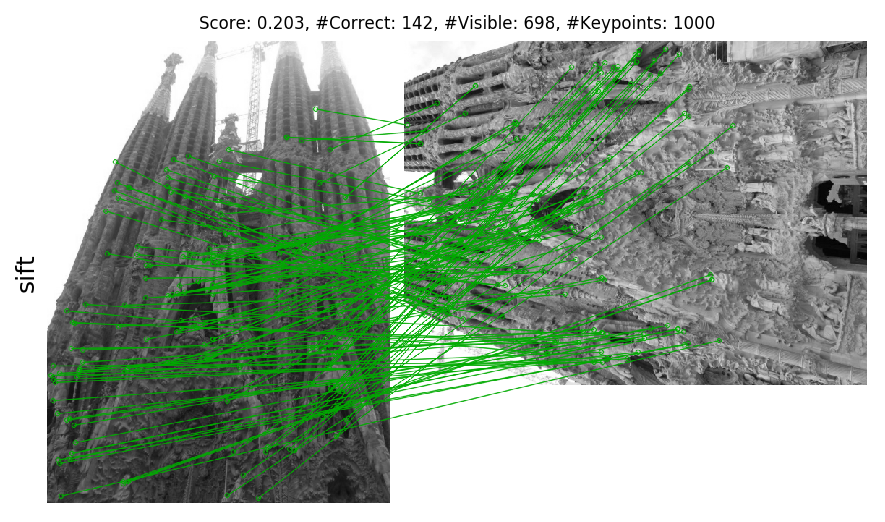

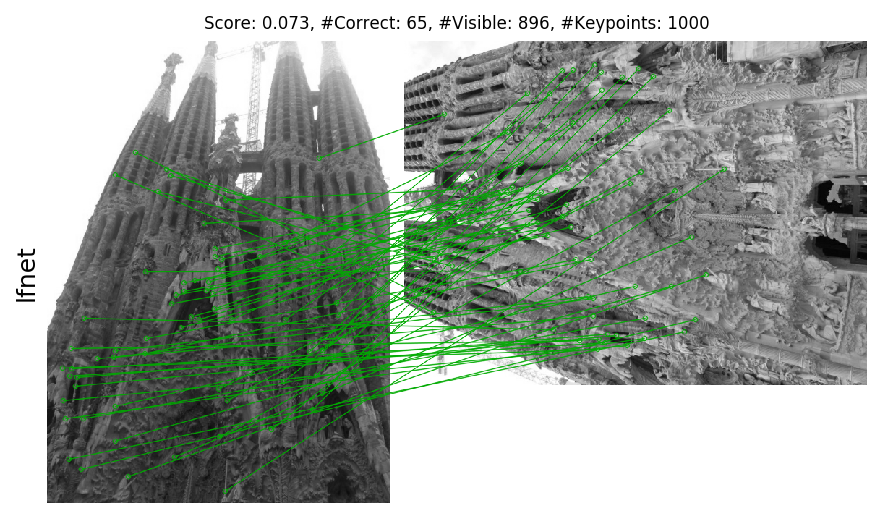

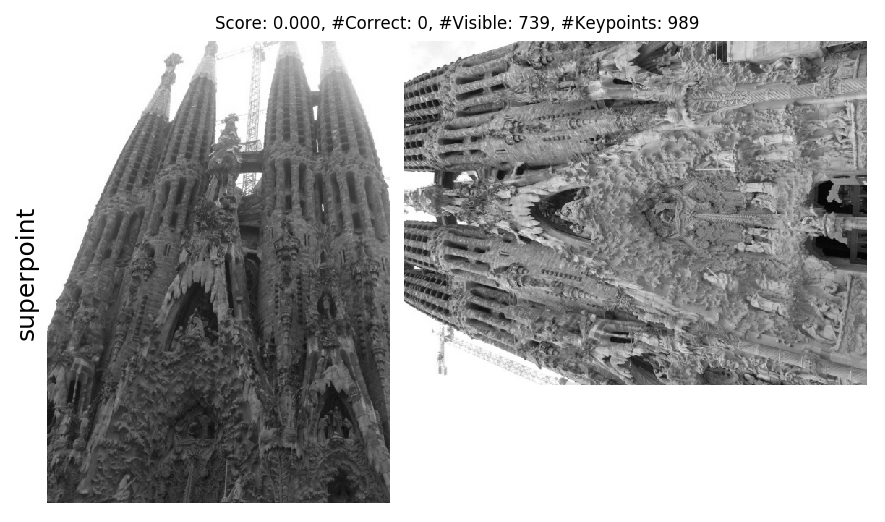

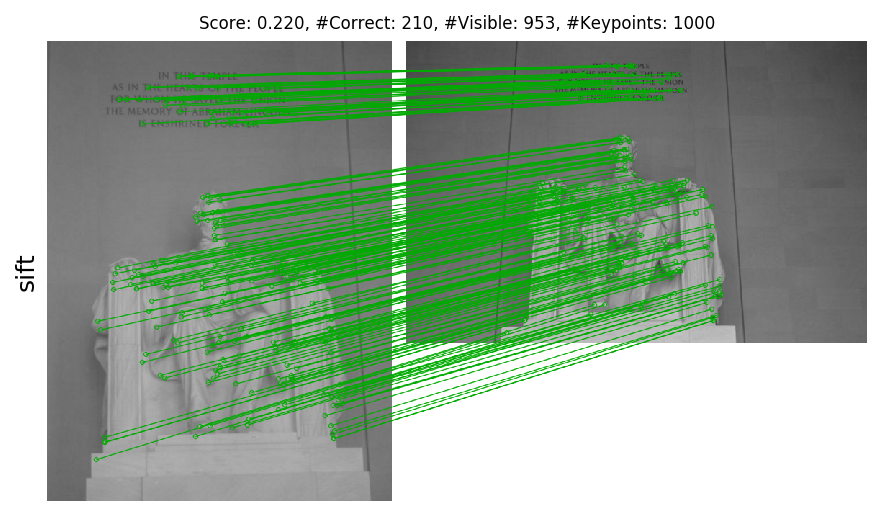

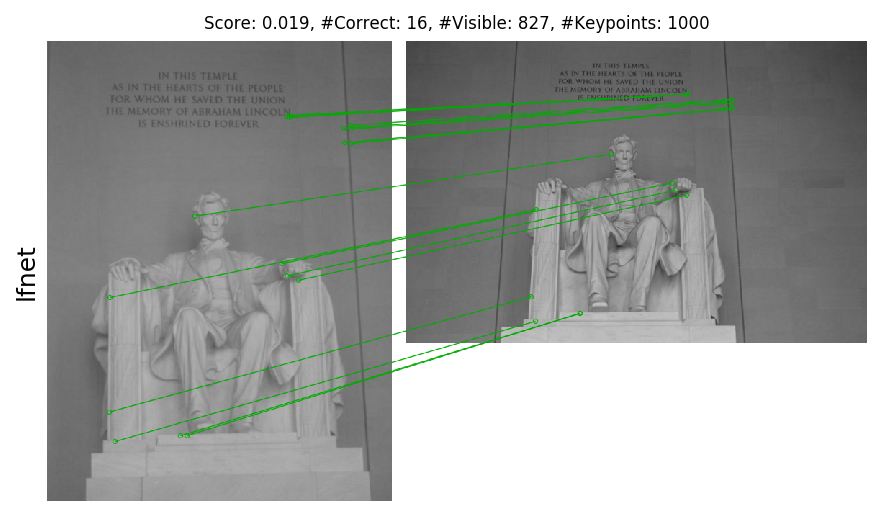

...

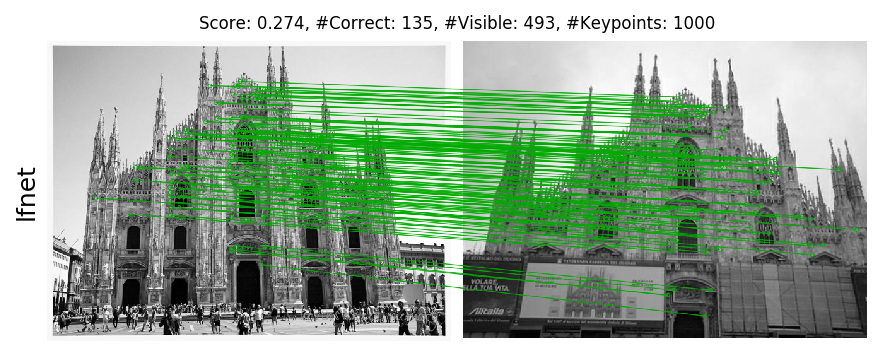

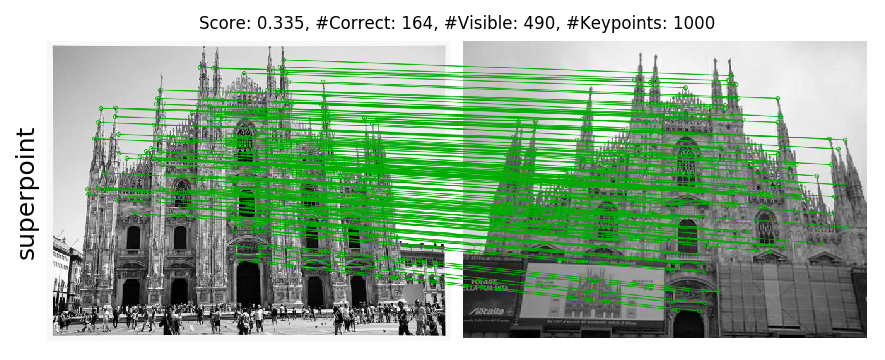

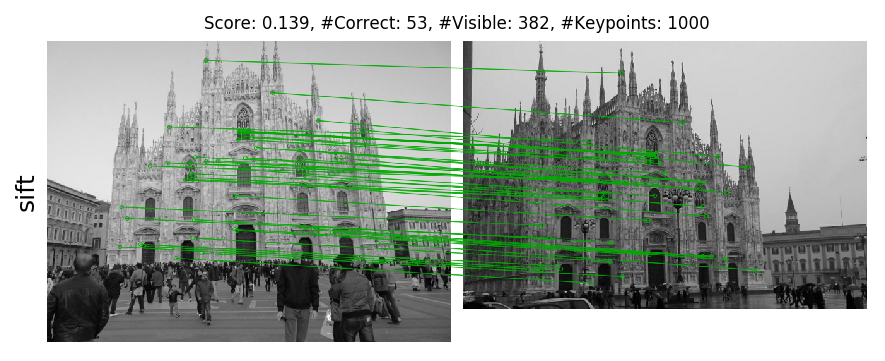

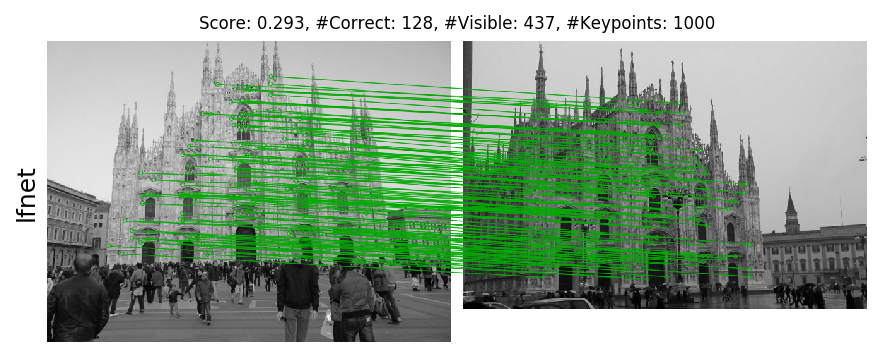

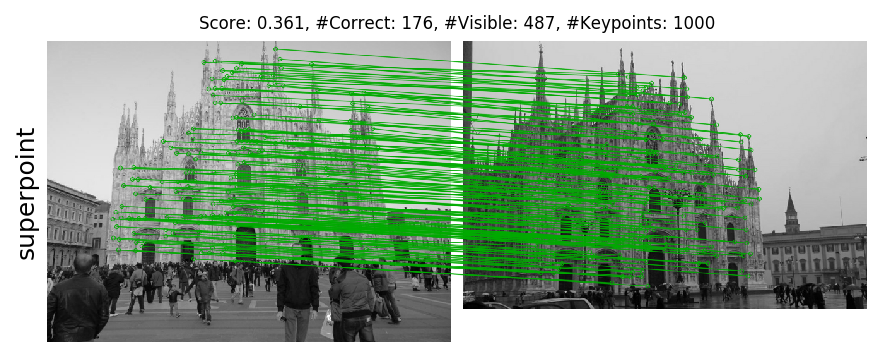

In [90]:
data_iter = dataset.get_test_set()
for _, data in zip(range(10), data_iter):
    for method, config in configs.items():
        pred1 = config['predictor'](data['image'], data['name'], **config)
        pred2 = config['predictor'](data['image2'], data['name2'], **config)

        all_matches, matches_dist = matching(
            pred1['descriptors'], pred2['descriptors'],
            do_ratio_test=config['do_ratio_test'], cross_check=False)
              
        kpts1_w, vis1, kpts1_3d_1 = keypoints_warp_3D(
            pred1['keypoints'], data['depth'], data['K'], data['K2'],
            np.linalg.inv(data['1_T_2']), data['image2'].shape[1::-1],
            depth2=data['depth2'], consistency_check=True)
        kpts2_w, vis2, kpts2_3d_2 = keypoints_warp_3D(
            pred2['keypoints'], data['depth2'], data['K2'],
            data['K'], data['1_T_2'], data['image'].shape[1::-1],
            depth2=data['depth'], consistency_check=True)
        
        ms, vis_m, cm, good = compute_matching_score_single(kpts1_w, pred2['keypoints'], all_matches, vis1)
        matches = all_matches[good]
        plot_images(
            [draw_matches(data['image'].astype(np.uint8), pred1['keypoints'],
                          data['image2'].astype(np.uint8), pred2['keypoints'],
                          matches, thickness=1, kp_radius=3, color=(0, 170, 0))],
            titles=[f'Score: {ms:.3f}, #Correct: {cm}, #Visible: {vis_m}, #Keypoints: {len(kpts1_w)}'],
            dpi=150, ylabel=method, labelfont=12, titlefont=8)